In [15]:
import tensorflow as tf
import numpy as np
import os
from tensorflow.keras import datasets, layers, models, regularizers
from load_data import DataLoader, DataGenerator
from CustomMSE import MeanSquaredErrorX, MeanSquaredErrorDobsonMasked, MeanRMSEDU
from CustomCall import LoggingCallback

In [16]:

measurements = ['SO2', 'CO', 'H2O', 'HCl', 'HNO3', 'N2O', 'Temperature']
time = [2004248, 2024010]
lon = [2.5, 177.5]
lat = [0, 88]

dataloader = DataLoader(measurements=measurements, time_period=time)
X_files, y_files = dataloader.get_files()


train_size = len(X_files) * 6 // 10
validation_size = len(X_files) * 2 // 10
test_size = len(X_files) * 2 // 10

X_train = X_files[:train_size]
y_train = y_files[:train_size]

X_validation = X_files[train_size:train_size + validation_size]
y_validation = y_files[train_size:train_size + validation_size]

X_test = X_files[train_size + validation_size:]
y_test = y_files[train_size + validation_size:]


In [17]:

if not os.path.isdir("saved"):
    os.mkdir("saved")

# Save names of files
save_name = os.path.join('saved', 'first_cnn_model')
checkpoint_save_name = save_name + '_cnn_net.chk'


In [18]:

training_data = DataGenerator(X_files=X_train, y_files=y_train, batch_size=16, shuffle=True, data_aug=False, normalise=True, normalise_sample=500, lat_range=lat, lon_range=lon)

norm_dict = training_data.get_norm_dict()

validation_data = DataGenerator(X_files=X_validation, y_files=y_validation, batch_size=16, shuffle=True, data_aug=False, normalise=True, norm_dict=norm_dict, lat_range=lat, lon_range=lon)
test_data = DataGenerator(X_test, y_test, batch_size=16, shuffle=False, data_aug=False, normalise=True, norm_dict = norm_dict, lat_range=lat, lon_range=lon)


  0% (0 of 500) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--
  0% (1 of 500) |                        | Elapsed Time: 0:00:00 ETA:   0:02:28
  0% (2 of 500) |                        | Elapsed Time: 0:00:00 ETA:   0:02:21
  0% (3 of 500) |                        | Elapsed Time: 0:00:00 ETA:   0:02:20
  0% (4 of 500) |                        | Elapsed Time: 0:00:01 ETA:   0:02:18
  1% (5 of 500) |                        | Elapsed Time: 0:00:01 ETA:   0:02:18
  1% (6 of 500) |                        | Elapsed Time: 0:00:01 ETA:   0:02:18
  1% (7 of 500) |                        | Elapsed Time: 0:00:02 ETA:   0:02:29
  1% (8 of 500) |                        | Elapsed Time: 0:00:02 ETA:   0:02:29
  1% (9 of 500) |                        | Elapsed Time: 0:00:02 ETA:   0:02:29
  2% (10 of 500) |                       | Elapsed Time: 0:00:02 ETA:   0:02:26
  2% (11 of 500) |                       | Elapsed Time: 0:00:03 ETA:   0:02:26
  2% (12 of 500) |                      

In [19]:

batch_X, batch_y = training_data[0]
input_shape = batch_X.shape[1:]
output_shape = batch_y.shape[1:]
H, W, C = output_shape[0], output_shape[1], output_shape[2]
C = C // 2
output_shape = (H, W, C)
print(f"Batch X shape: {batch_X.shape}\nBatch y shape: {batch_y.shape}")
print(f"Batches per epoch: {len(training_data)}")

Batch X shape: (16, 36, 23, 896)
Batch y shape: (16, 36, 23, 84)
Batches per epoch: 262


In [20]:
model = models.Sequential()
# from here to 1e-5
# try not on conv but on dense layers
# Try batch normalisation after 3rd conv layer - just test it
l2_lambda = 0.0001

# still to try:
# batch normalisation, SGD optimiser

model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=input_shape))
model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same'))
# ADD batch norm here
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
# ADD batch norm here
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))


model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
# ADD batch norm here
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

# model.add(layers.Dropout(0.25)) 

model.add(layers.Flatten())


# Only regularise on dense layers but not the last one 
model.add(layers.Dense(512, activation='relu')) # can add , kernel_regularizer=regularizers.l2(l2_lambda) to these two dense layers if need be 
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dropout(0.25))

model.add(layers.Dense(H * W * C, activation='linear'))


model.add(layers.Reshape(output_shape))

# Can try SGD with a higher learning rate 
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss=MeanSquaredErrorX(C), metrics=[MeanRMSEDU(norm_dict['O3'][1], norm_dict['O3'][0], C)])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 36, 23, 32)        258080    
                                                                 
 conv2d_10 (Conv2D)          (None, 36, 23, 32)        9248      
                                                                 
 conv2d_11 (Conv2D)          (None, 36, 23, 32)        9248      
                                                                 
 batch_normalization_3 (Batc  (None, 36, 23, 32)       128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 18, 11, 32)       0         
 2D)                                                             
                                                                 
 conv2d_12 (Conv2D)          (None, 18, 11, 64)       

In [21]:
# loggingCallback = LoggingCallback(model=model)
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_save_name,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)


In [22]:

history = model.fit(training_data,
        validation_data=validation_data,
        epochs=25,
        verbose=1,
        callbacks=[model_checkpoint_callback])

# model.load_weights(checkpoint_save_name)

Epoch 1/25
262/262 [==============================] - 7296s 28s/step - loss: 1.5929e-04 - ppmv: 1.5593e-08 - val_loss: 1.1177e-11 - val_ppmv: 2.4267e-11
Epoch 2/25
262/262 [==============================] - 7442s 28s/step - loss: 5.9304e-12 - ppmv: 1.3160e-11 - val_loss: 3.3275e-11 - val_ppmv: 8.5648e-12
Epoch 3/25
262/262 [==============================] - 9378s 36s/step - loss: 3.3114e-13 - ppmv: 2.6138e-12 - val_loss: 5.9266e-14 - val_ppmv: 9.8311e-13
Epoch 4/25
262/262 [==============================] - 12583s 48s/step - loss: 2.7083e-14 - ppmv: 7.0520e-13 - val_loss: 4.1946e-15 - val_ppmv: 2.3876e-13
Epoch 5/25
262/262 [==============================] - 12649s 48s/step - loss: 1.8470e-15 - ppmv: 1.7123e-13 - val_loss: 2.4946e-16 - val_ppmv: 6.4072e-14
Epoch 6/25
262/262 [==============================] - 12486s 48s/step - loss: 1.1521e-16 - ppmv: 4.6211e-14 - val_loss: 1.7363e-17 - val_ppmv: 1.6972e-14
Epoch 7/25
262/262 [==============================] - 12684s 48s/step - loss: 9

In [23]:

metrics = model.evaluate(test_data)
print(metrics)

88/88 [==============================] - 1839s 21s/step - loss: 2.6795e-24 - ppmv: 0.0000e+00
[2.6795457276543307e-24, 0.0]


dict_keys(['loss', 'ppmv', 'val_loss', 'val_ppmv'])


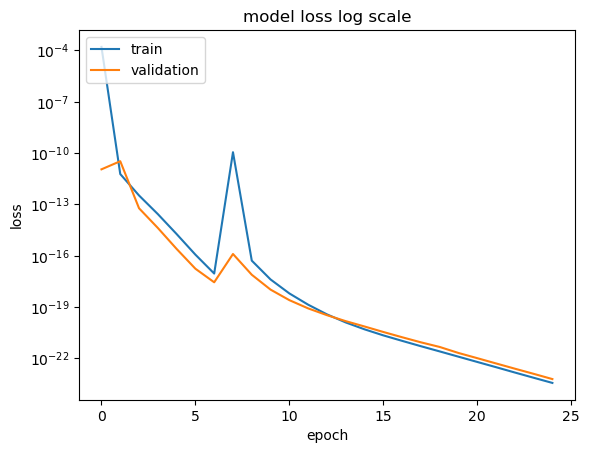

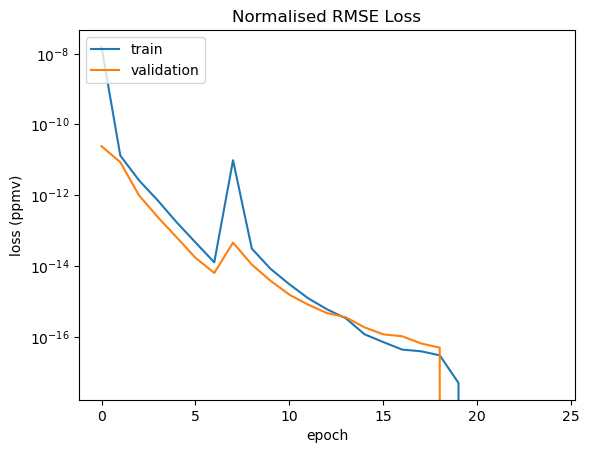

In [24]:
import matplotlib.pyplot as plt

print(history.history.keys())
#  "Accuracy"
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss log scale')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.yscale('log')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()
# "Loss"
plt.plot(history.history['ppmv'])
plt.plot(history.history['val_ppmv'])
plt.title('Normalised RMSE Loss')
plt.ylabel('loss (ppmv)')
plt.xlabel('epoch')
plt.yscale('log')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [25]:
# final_save = os.path.join('saved', 'final_save.h5') 
# model.save_weights(final_save)

1/1 [==============================] - 0s 36ms/step
0.0737164
1.0 0.0
(16, 36, 23, 42)


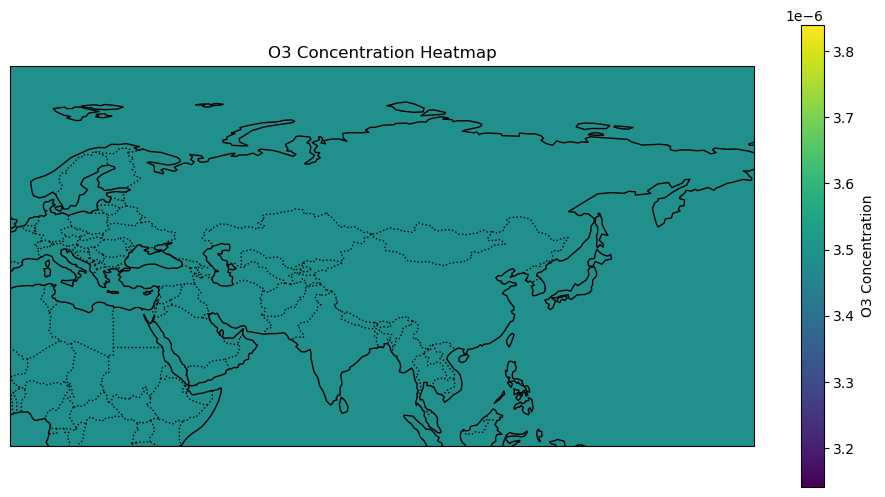

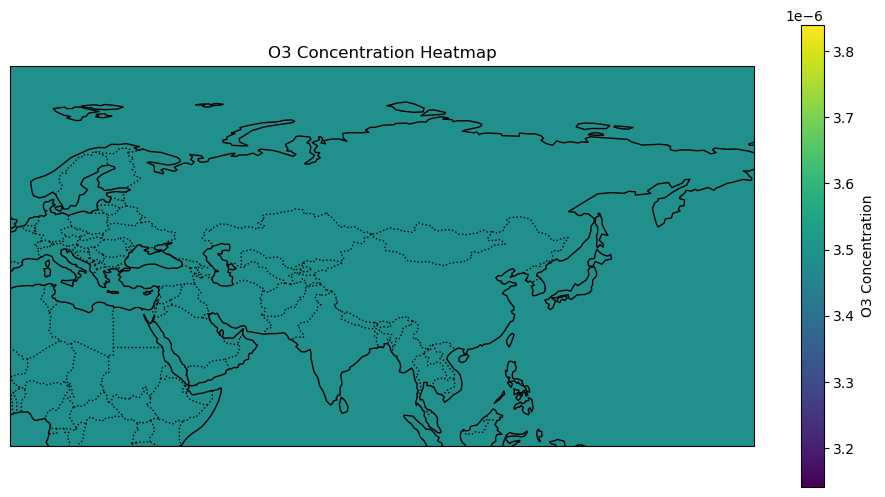

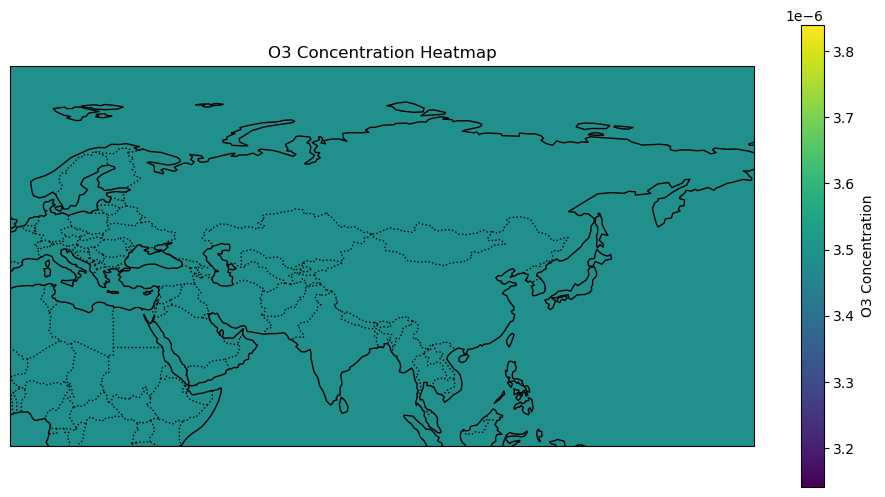

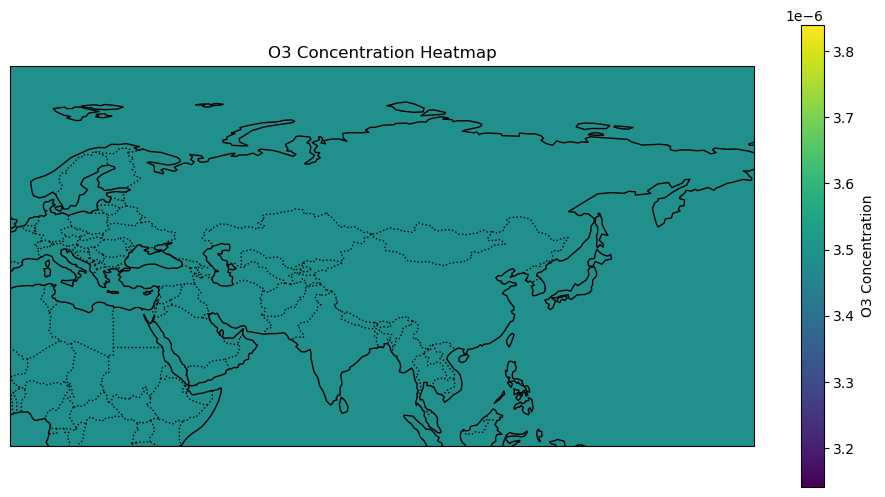

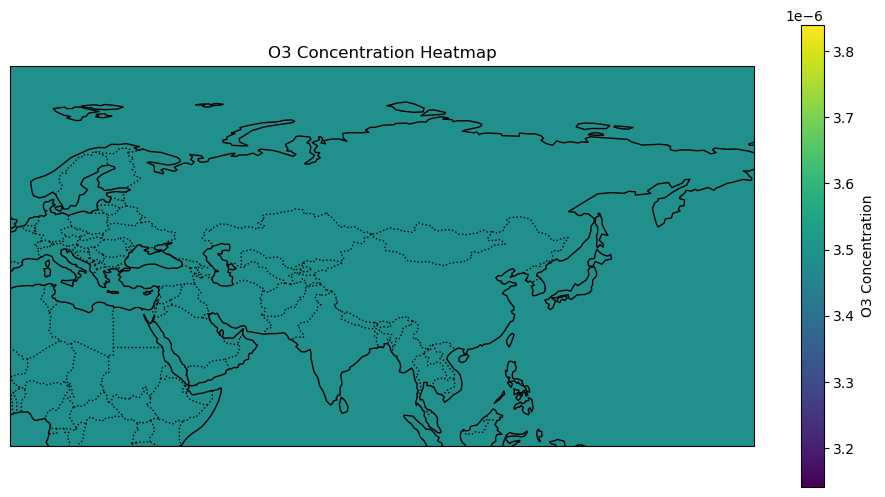

...

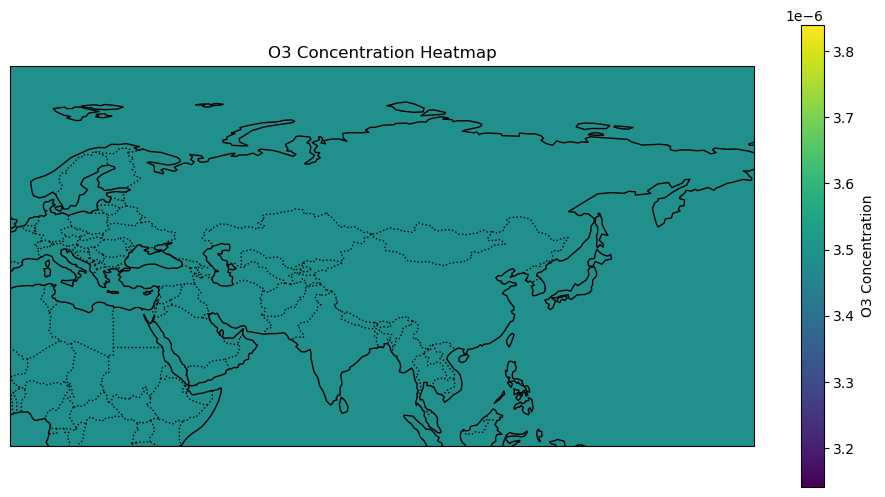

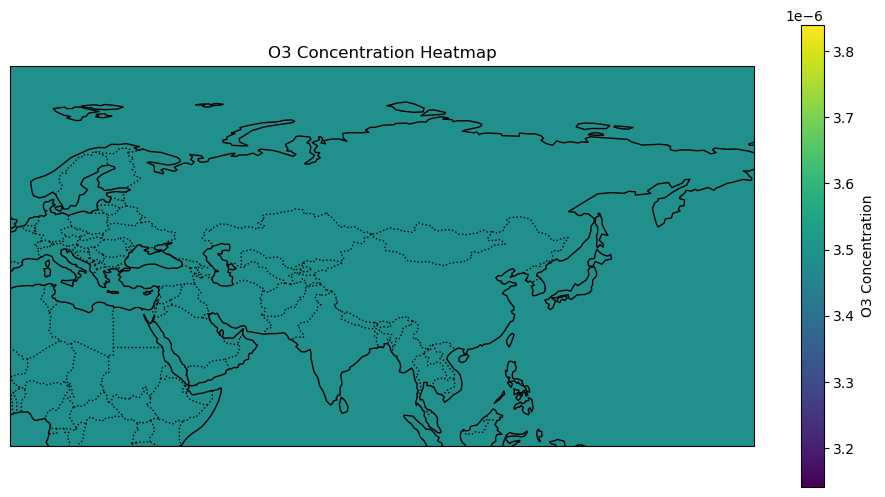

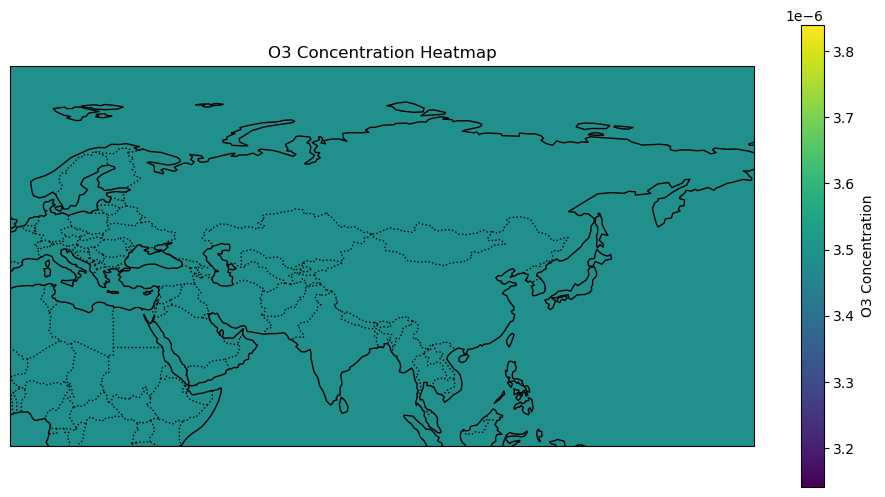

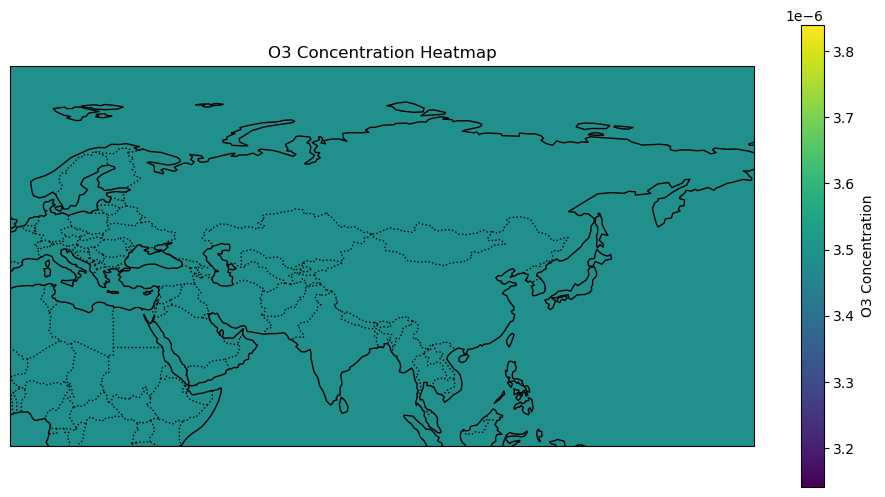

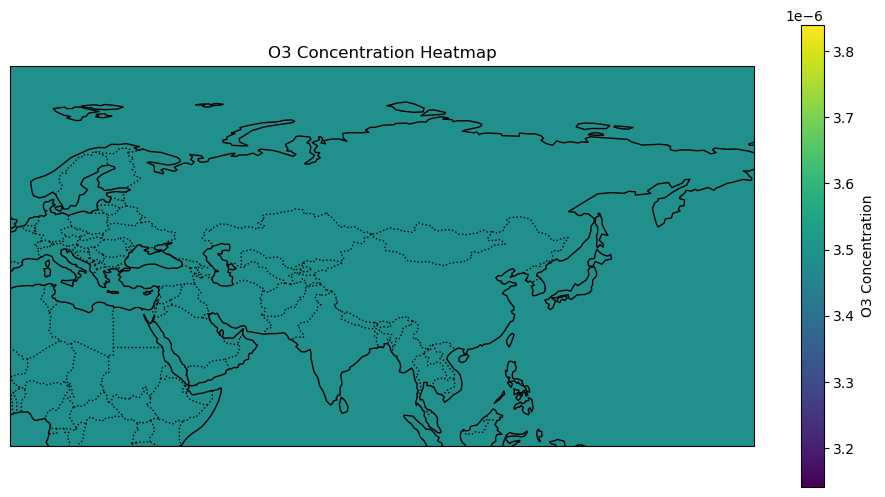

actual:


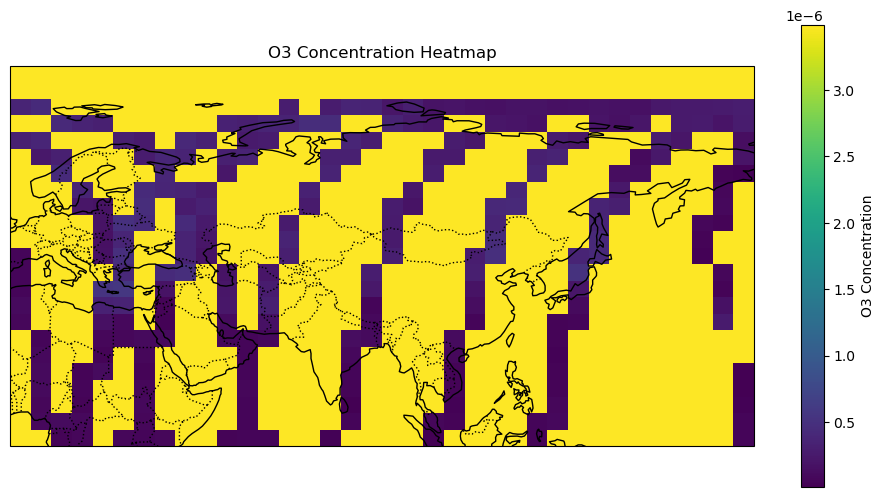

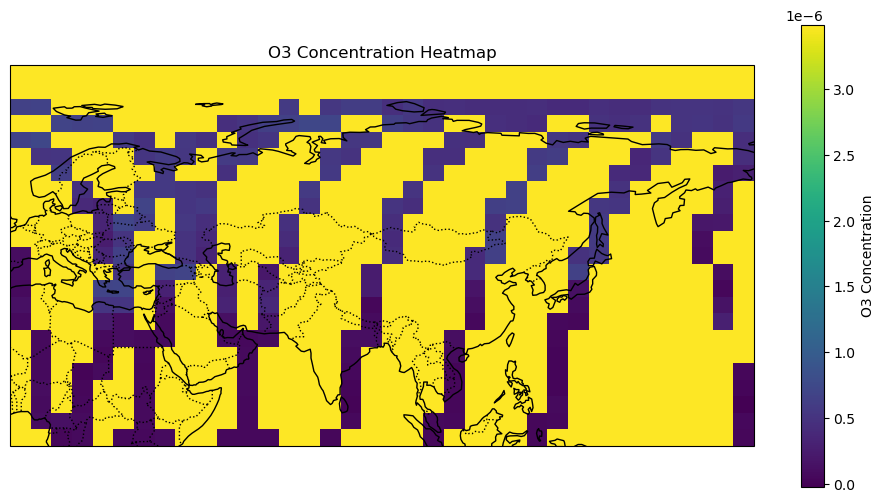

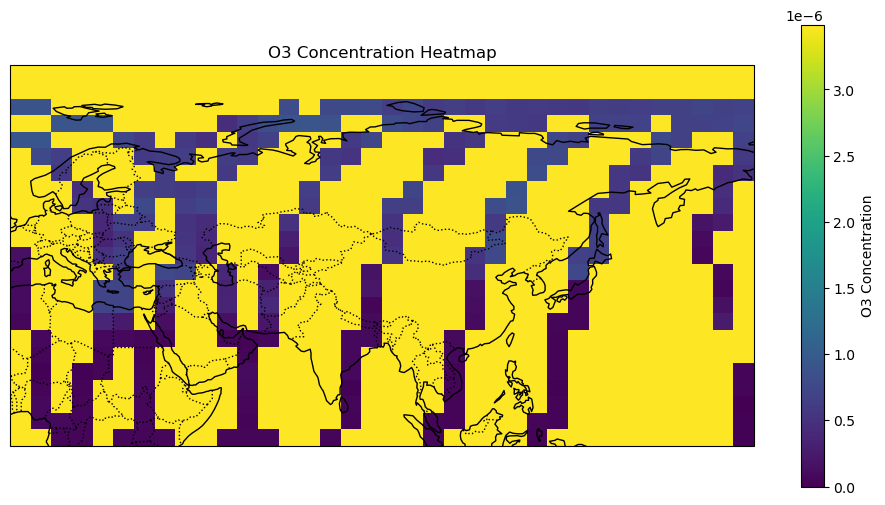

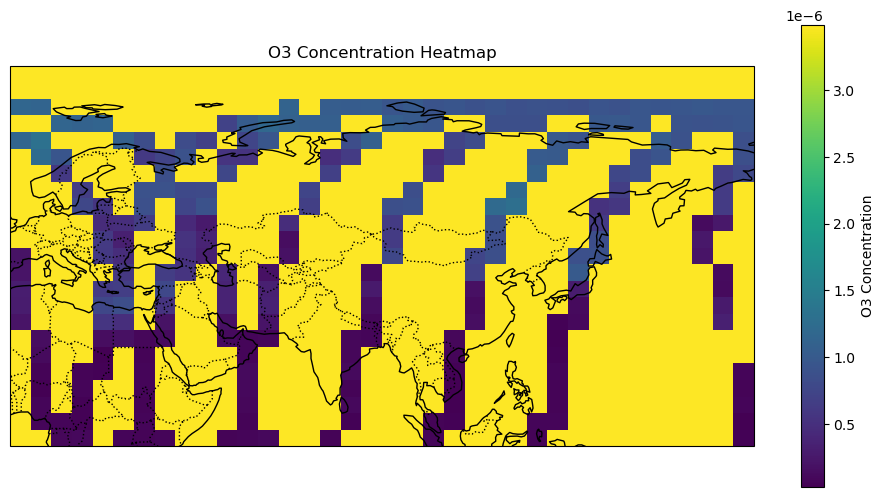

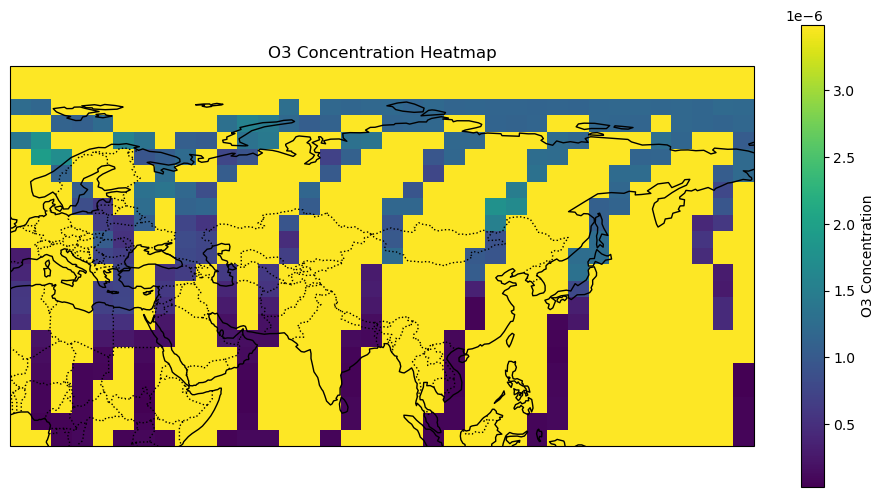

...

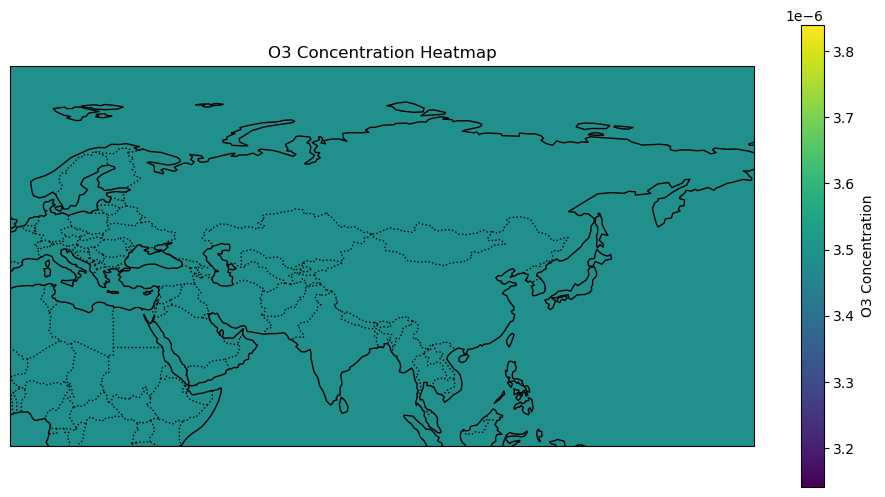

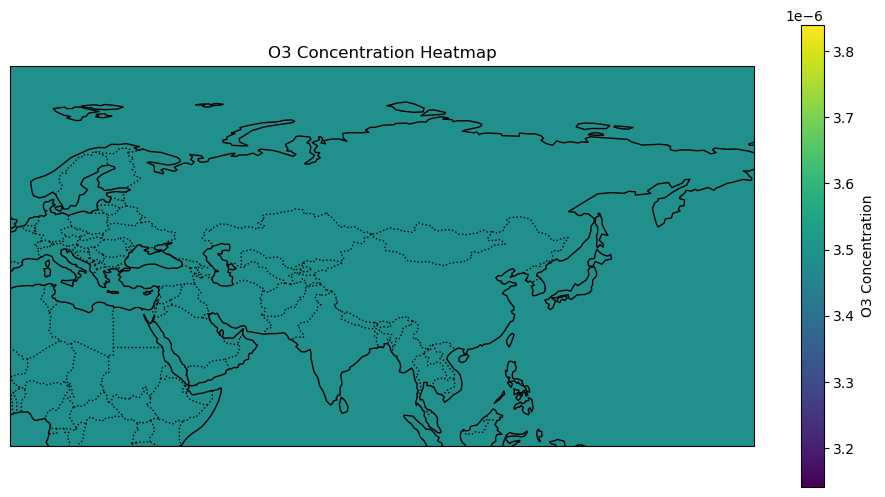

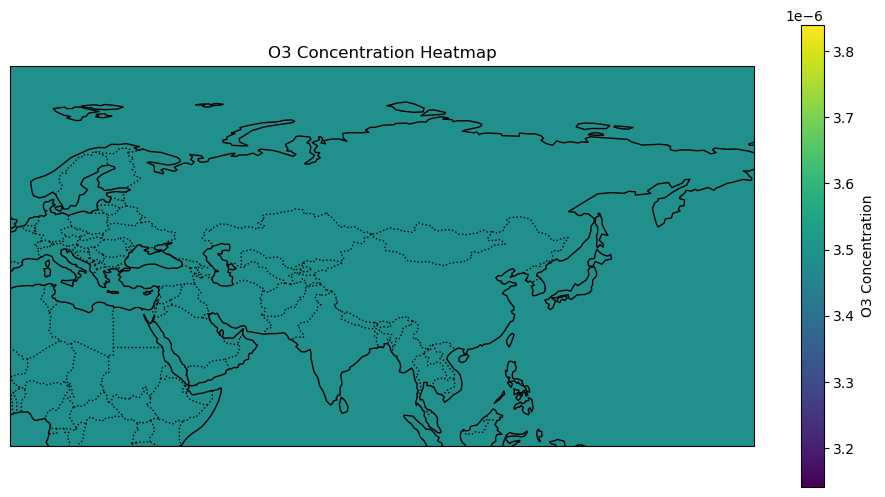

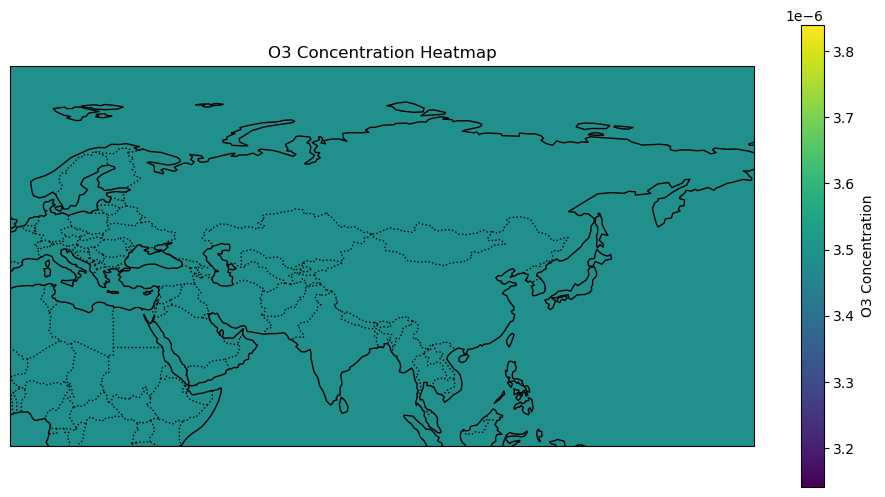

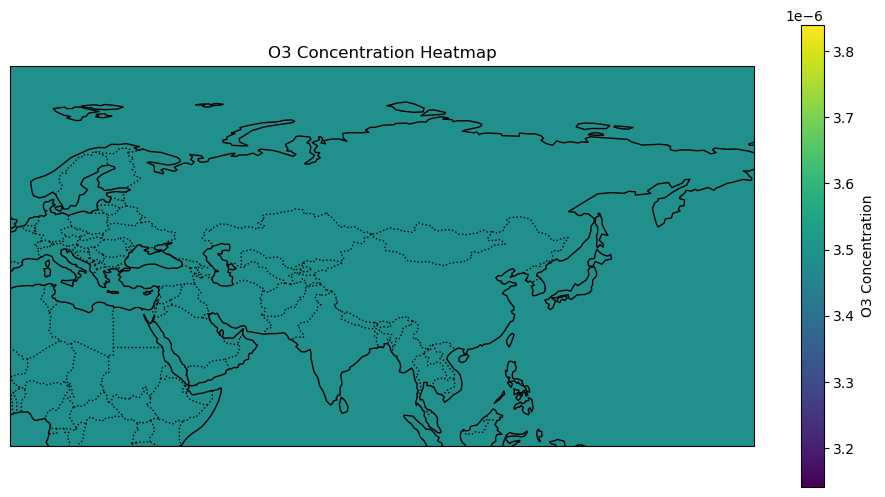

In [29]:

# Predict using the test data
batch_X, batch_y = test_data[0]
predictions = model.predict(batch_X)

w = norm_dict['O3'][1]
b = norm_dict['O3'][0]

# print(f'Test Predictions: {predictions[0][0]}')

masks = batch_y[:, :, :, C:]
# predictions *= masks
batch_y = batch_y[:, :, :, :C]
# batch_y *= masks
sq_error = np.sum(np.square((predictions - batch_y)), axis=(1,2,3))
sq_error /= np.sum(masks, axis=(1,2,3))
print(np.mean(sq_error))

print(np.max(masks), np.min(masks))
# for prediction in predictions:
#     print(np.max(prediction), np.min(prediction))
#     print(np.max(batch_y), np.min(batch_y))
    
predictions *= masks

predictions = predictions * w + b
batch_y = batch_y * w + b

    #    y_true = y_true * self.w + self.b
    #     y_pred = y_pred * self.w + self.b

print(predictions.shape)



training_data.make_map(predictions[0], 'O3')
print('actual:')
training_data.make_map(batch_y[0], 'O3')
